# 14. 직접 수집한 주가 데이터로 시각화

## 14.1 `FinanceDataReader`를 통한 주가 데이터 수집

In [1]:
import FinanceDataReader as fdr

In [2]:
# 특정 주가 불러오기
amd = fdr.DataReader("AMD", "2015", "2021")
amd.shape

(1511, 6)

In [3]:
amd.head()

,Close,Open,High,Low,Volume,Change
Date,,,,,,
2015-01-02,2.69,2.70,2.73,2.64,8330000.0,0.0075
2015-01-05,2.66,2.67,2.70,2.64,8880000.0,-0.0112
2015-01-06,2.63,2.65,2.66,2.55,13920000.0,-0.0113
2015-01-07,2.58,2.63,2.65,2.54,12380000.0,-0.0190
2015-01-08,2.61,2.59,2.65,2.56,11140000.0,0.0116


In [4]:
amd.tail()

,Close,Open,High,Low,Volume,Change
Date,,,,,,
2020-12-24,91.81,91.80,92.51,91.31,16710000.0,0.0028
2020-12-28,91.60,93.04,93.12,90.83,30630000.0,-0.0023
2020-12-29,90.62,91.51,92.40,89.46,31750000.0,-0.0107
2020-12-30,92.29,90.86,92.85,90.20,25840000.0,0.0184
2020-12-31,91.71,92.10,92.30,90.87,24930000.0,-0.0063


<br>

## 14.2 선 그래프 그리기

In [5]:
import plotly.express as px

<br>

### 14.2.1 종합

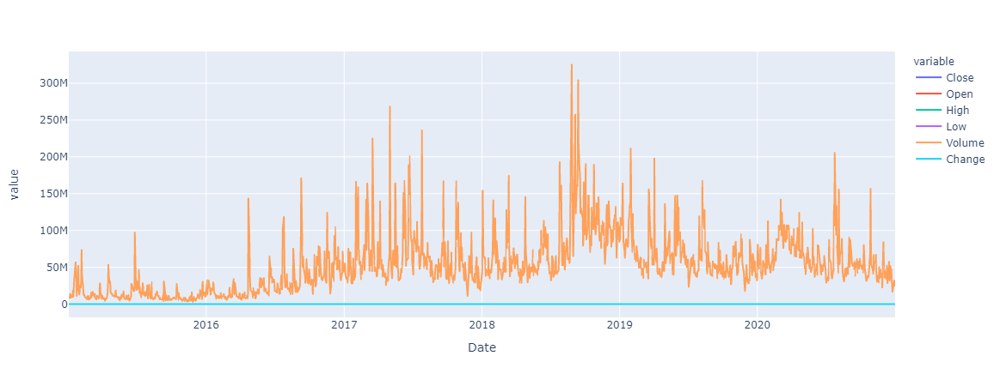

In [6]:
px.line(amd)

<br>

### 14.2.2 종가

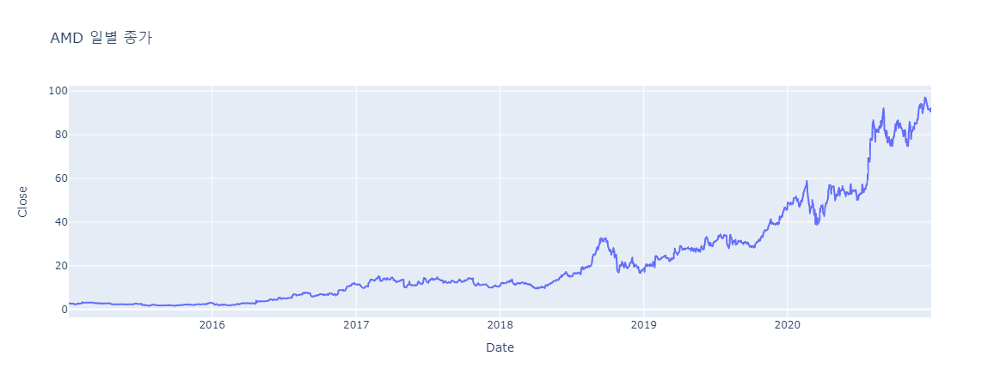

In [7]:
px.line(amd, y='Close', title='AMD 일별 종가')

<br>

### 14.2.3 전일비

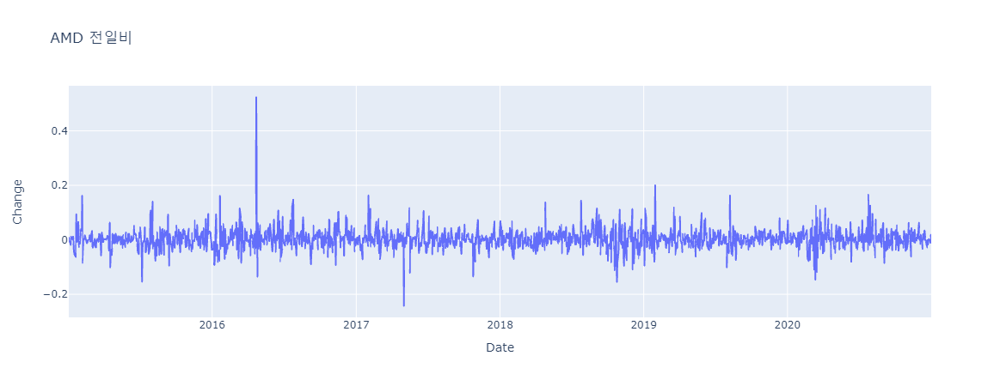

In [8]:
px.line(amd, y='Change', title='AMD 전일비')

<br>

### 14.2.4 전일비 히스토그램

- `marginal='box'` 옵션 사용

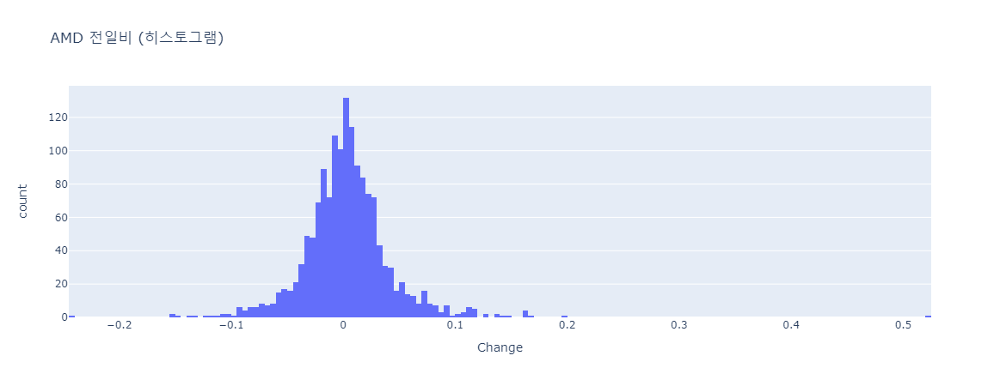

In [9]:
px.histogram(amd, x='Change', title='AMD 전일비 (히스토그램)')

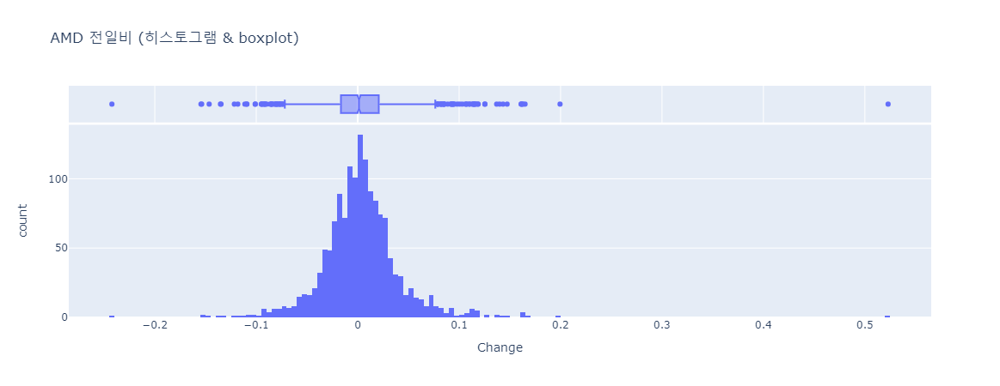

In [10]:
px.histogram(amd, x='Change', marginal='box', title='AMD 전일비 (히스토그램 & boxplot)')

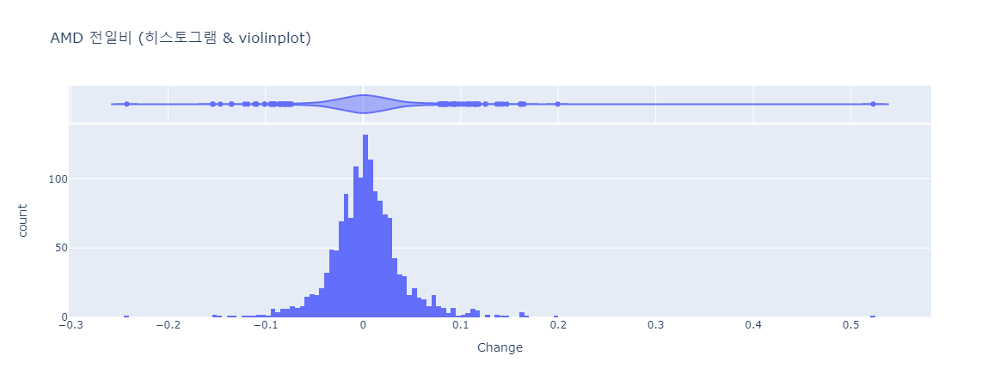

In [11]:
px.histogram(amd, x='Change', marginal='violin', title='AMD 전일비 (히스토그램 & violinplot)')

<br>

## 14.3 Range Slider와 함께 Candlestick 그리기

In [12]:
import plotly.graph_objects as go

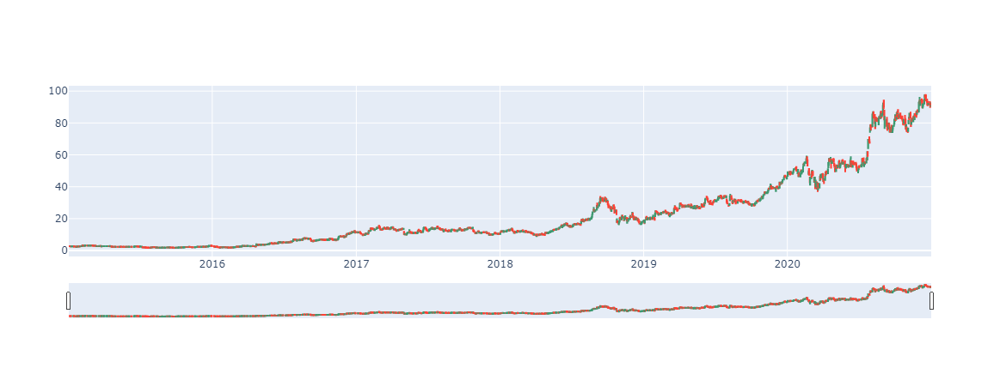

In [13]:
fig = go.Figure(data=[
    go.Candlestick(x=amd.index,
                   open=amd['Open'],
                   high=amd['High'],
                   low=amd['Low'],
                   close=amd['Close'])
])

fig.show()

<br>

## 14.4 OHLC 차트 그리기

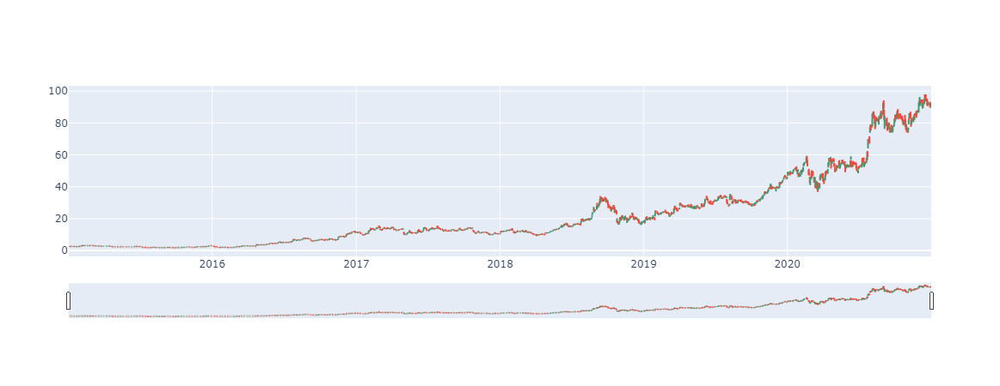

In [14]:
fig = go.Figure(data=[
    go.Ohlc(x=amd.index,
                   open=amd['Open'],
                   high=amd['High'],
                   low=amd['Low'],
                   close=amd['Close'])
])

fig.show()

<br>

## 14.5 여러 종목의 수익률 보기

### 14.5.1 여러 종목의 종가 가져오기

In [15]:
FAANG = ['FB', 'AMZN', 'AAPL', 'NFLX', 'GOOGL']
FAANG

['FB', 'AMZN', 'AAPL', 'NFLX', 'GOOGL']

In [16]:
faang_list = [fdr.DataReader(code, '2019', '2021')['Close'] for code in FAANG]

In [17]:
faang_list

[Date
 2019-01-02    135.68
 2019-01-03    131.74
 2019-01-04    137.95
 2019-01-07    138.05
 2019-01-08    142.53
                ...  
 2020-12-24    267.40
 2020-12-28    277.00
 2020-12-29    276.78
 2020-12-30    271.87
 2020-12-31    273.16
 Name: Close, Length: 505, dtype: float64, Date
 2019-01-02    1539.13
 2019-01-03    1500.28
 2019-01-04    1575.39
 2019-01-07    1629.51
 2019-01-08    1656.58
                ...   
 2020-12-24    3172.69
 2020-12-28    3283.96
 2020-12-29    3322.00
 2020-12-30    3285.85
 2020-12-31    3256.93
 Name: Close, Length: 505, dtype: float64, Date
 2019-01-02     39.48
 2019-01-03     35.55
 2019-01-04     37.06
 2019-01-07     36.98
 2019-01-08     37.69
                ...  
 2020-12-24    131.97
 2020-12-28    136.69
 2020-12-29    134.87
 2020-12-30    133.72
 2020-12-31    132.69
 Name: Close, Length: 505, dtype: float64, Date
 2019-01-02    267.66
 2019-01-03    271.20
 2019-01-04    297.57
 2019-01-07    315.34
 2019-01-08    320.27
   

<br>

### 14.5.2 `concat`으로 데이터 병합하기

In [18]:
df_faang = pd.concat(faang_list, axis=1)
df_faang.columns = FAANG # 컬럼명 변경
df_faang.head()

,FB,AMZN,AAPL,NFLX,GOOGL
Date,,,,,
2019-01-02,135.68,1539.13,39.48,267.66,1054.68
2019-01-03,131.74,1500.28,35.55,271.20,1025.47
2019-01-04,137.95,1575.39,37.06,297.57,1078.07
2019-01-07,138.05,1629.51,36.98,315.34,1075.92
2019-01-08,142.53,1656.58,37.69,320.27,1085.37


In [19]:
df_faang.tail()

,FB,AMZN,AAPL,NFLX,GOOGL
Date,,,,,
2020-12-24,267.40,3172.69,131.97,513.97,1734.16
2020-12-28,277.00,3283.96,136.69,519.12,1773.96
2020-12-29,276.78,3322.00,134.87,530.87,1757.76
2020-12-30,271.87,3285.85,133.72,524.59,1736.25
2020-12-31,273.16,3256.93,132.69,540.73,1752.64


<br>

### 14.5.3 일별 수익률 구하기

In [20]:
df_ratio = df_faang / df_faang.iloc[0] - 1
df_ratio.head()

,FB,AMZN,AAPL,NFLX,GOOGL
Date,,,,,
2019-01-02,0.000000,0.000000,0.000000,0.000000,0.000000
2019-01-03,-0.029039,-0.025242,-0.099544,0.013226,-0.027696
2019-01-04,0.016731,0.023559,-0.061297,0.111746,0.022177
2019-01-07,0.017468,0.058721,-0.063323,0.178136,0.020139
2019-01-08,0.050486,0.076309,-0.045339,0.196555,0.029099


In [21]:
df_ratio.tail()

,FB,AMZN,AAPL,NFLX,GOOGL
Date,,,,,
2020-12-24,0.970814,1.061353,2.342705,0.920235,0.644252
2020-12-28,1.041568,1.133647,2.462259,0.939475,0.681989
2020-12-29,1.039947,1.158362,2.416160,0.983374,0.666629
2020-12-30,1.003759,1.134875,2.387031,0.959912,0.646234
2020-12-31,1.013267,1.116085,2.360942,1.020212,0.661774


<br>

### 14.5.4 DataFrame 에 `columns.name` 설정

- 서브플롯을 그리기 위해 `columns.name` 설정

In [22]:
df_ratio.columns

Index(['FB', 'AMZN', 'AAPL', 'NFLX', 'GOOGL'], dtype='object')

In [23]:
df_ratio.columns.name = 'company'
df_ratio.columns

Index(['FB', 'AMZN', 'AAPL', 'NFLX', 'GOOGL'], dtype='object', name='company')

<br>

### 14.5.5 선 그래프 그리기

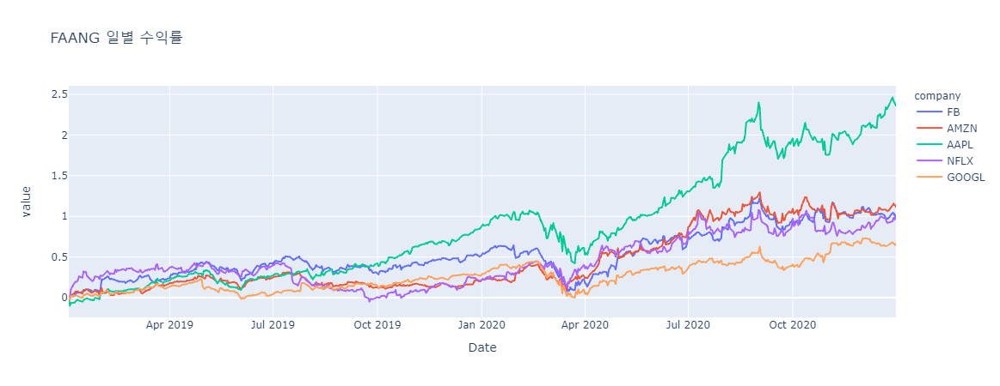

In [25]:
px.line(df_ratio, title='FAANG 일별 수익률')

<br>

### 14.5.6 areaplot 그리기

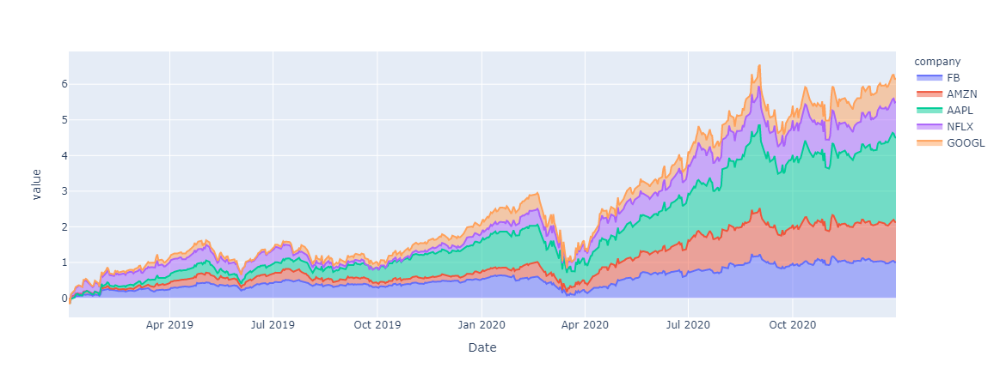

In [26]:
px.area(df_ratio)

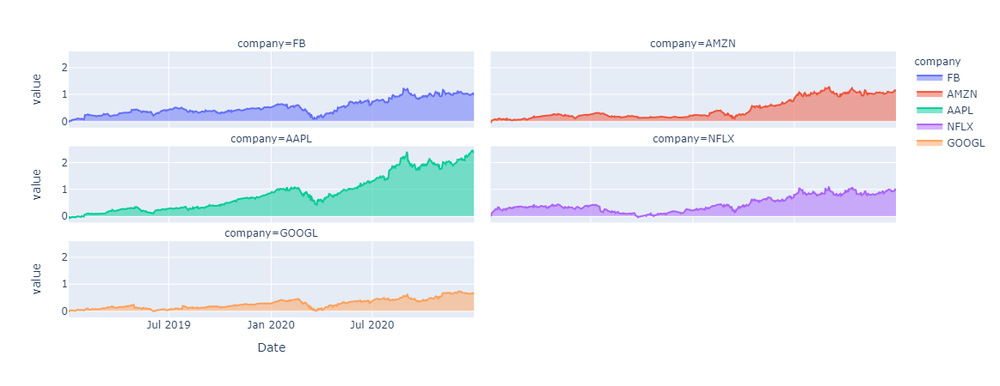

In [28]:
px.area(df_ratio, facet_col='company', facet_col_wrap=2)

<br>

### 14.5.7 막대 그래프 그리기

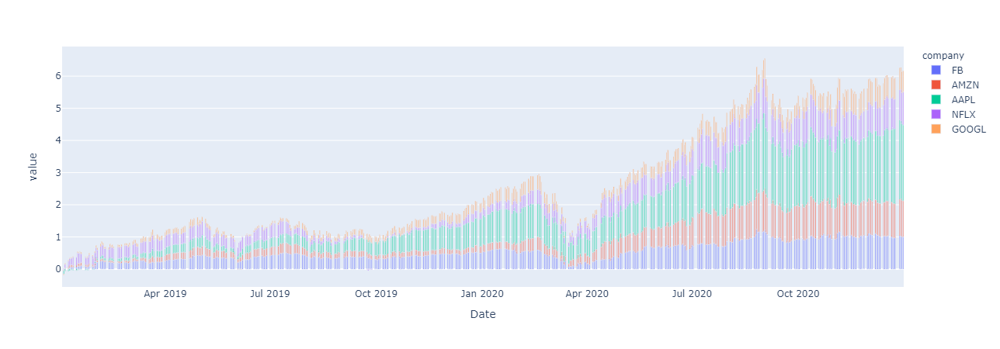

In [29]:
px.bar(df_ratio)

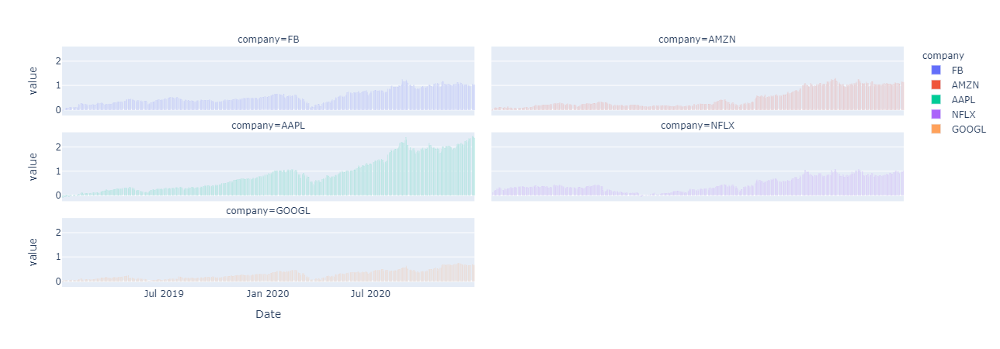

In [31]:
# 서브플롯
px.bar(df_ratio, facet_col='company', facet_col_wrap=2)

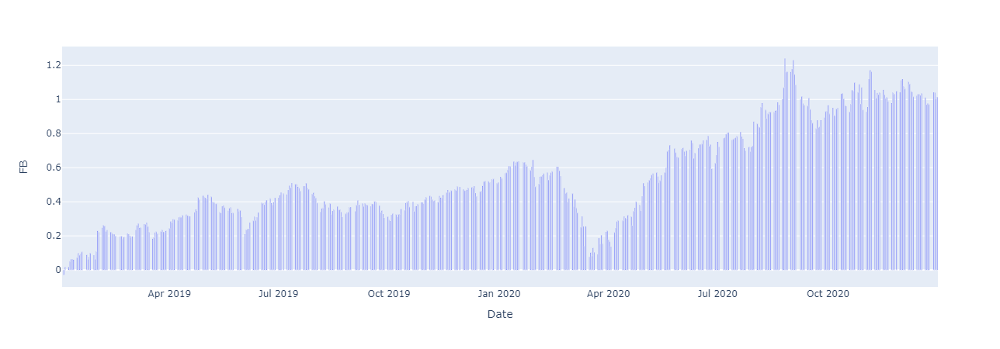

In [32]:
# 특정 종목
px.bar(df_ratio, x=df_ratio.index, y='FB')

<br>

### 14.5.8 scatterplot 그리기

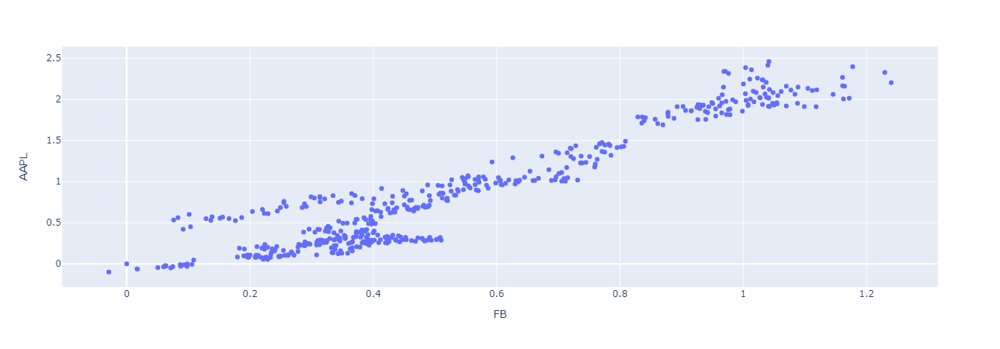

In [33]:
px.scatter(df_ratio, x='FB', y='AAPL')

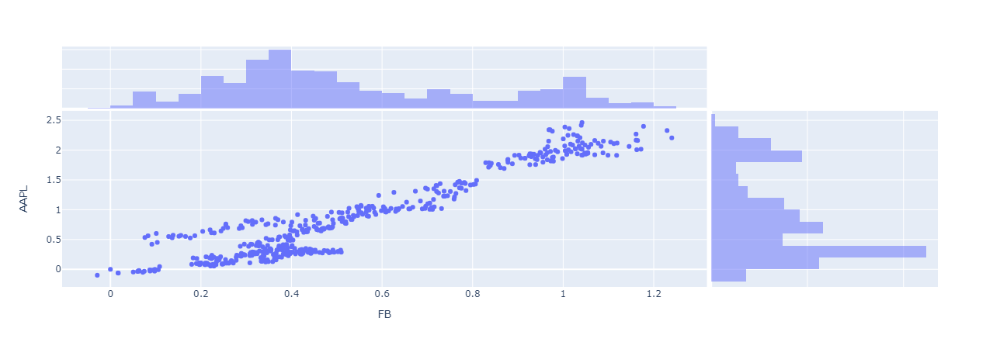

In [35]:
px.scatter(df_ratio, x='FB', y='AAPL', marginal_x='histogram', marginal_y='histogram')

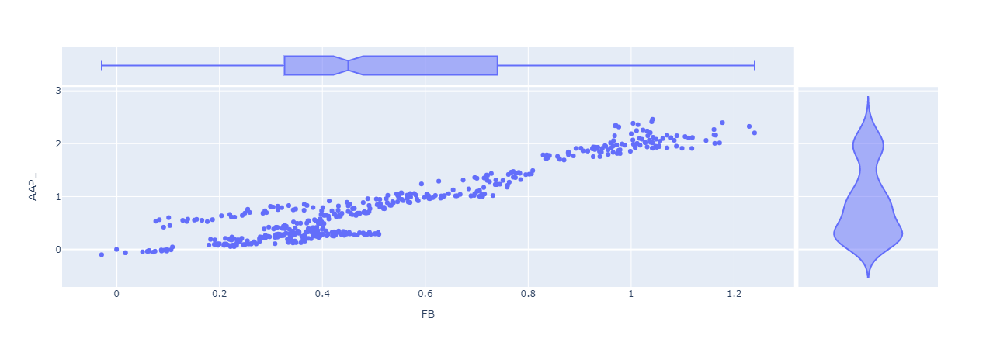

In [36]:
px.scatter(df_ratio, x='FB', y='AAPL', marginal_x='box', marginal_y='violin')

<br>

## 14.6 distribution 그리기

### 14.6.1 box

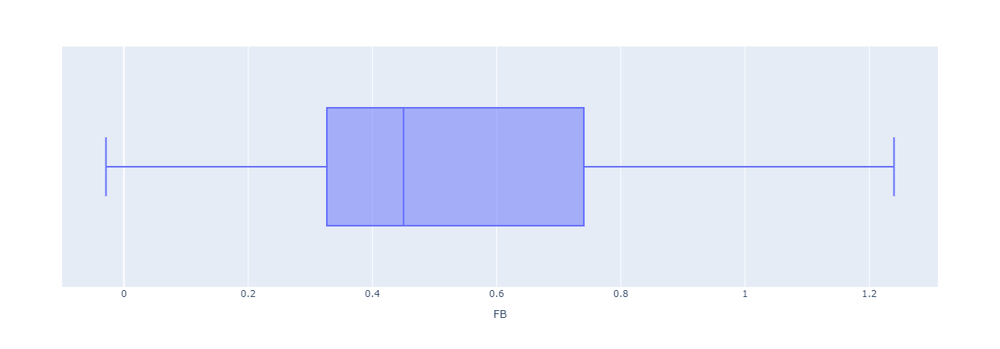

In [42]:
px.box(df_ratio, x='FB')

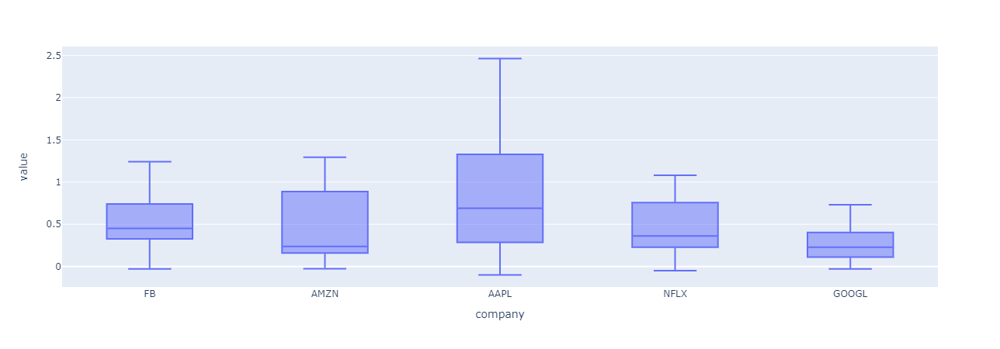

In [39]:
px.box(df_ratio)

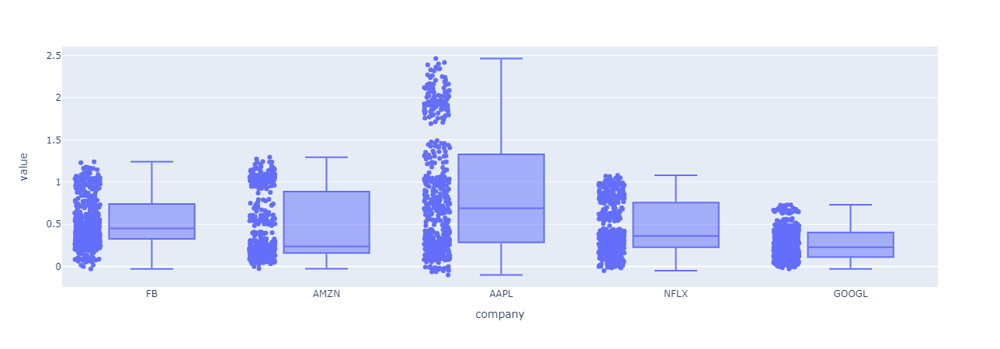

In [43]:
px.box(df_ratio, points='all')

<br>

### 14.6.2 violin

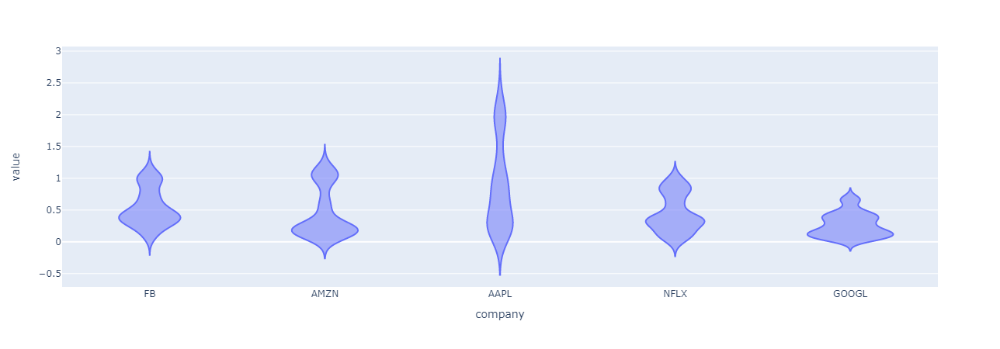

In [44]:
px.violin(df_ratio)

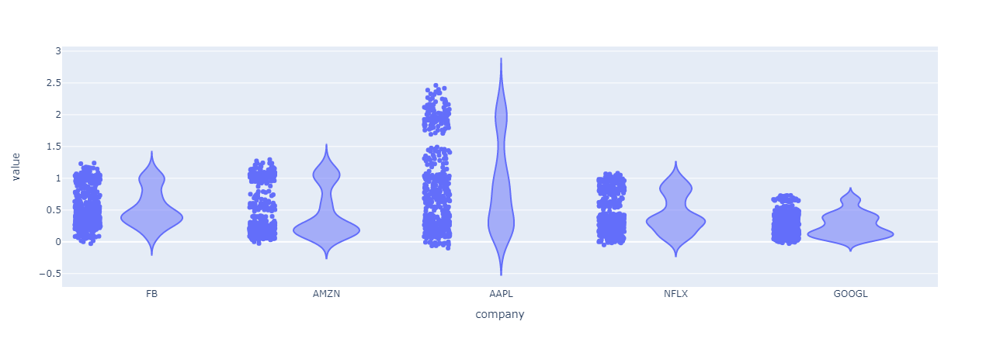

In [45]:
px.violin(df_ratio, points='all')

<br>

### 14.6.3 strip

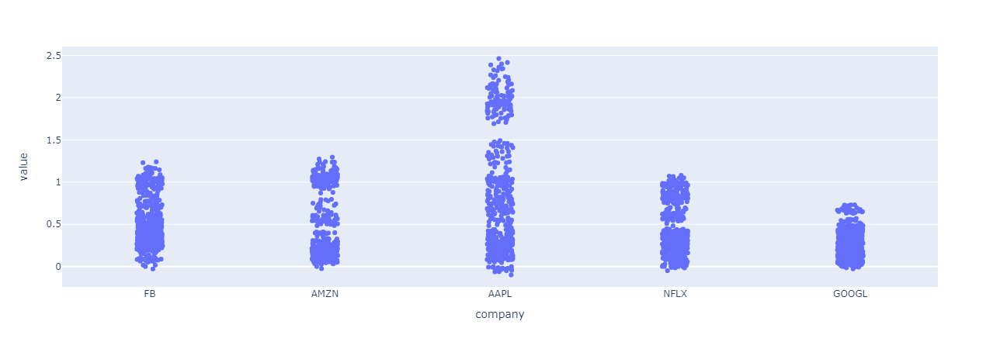

In [46]:
px.strip(df_ratio)

<br>

### 14.6.4 histogram

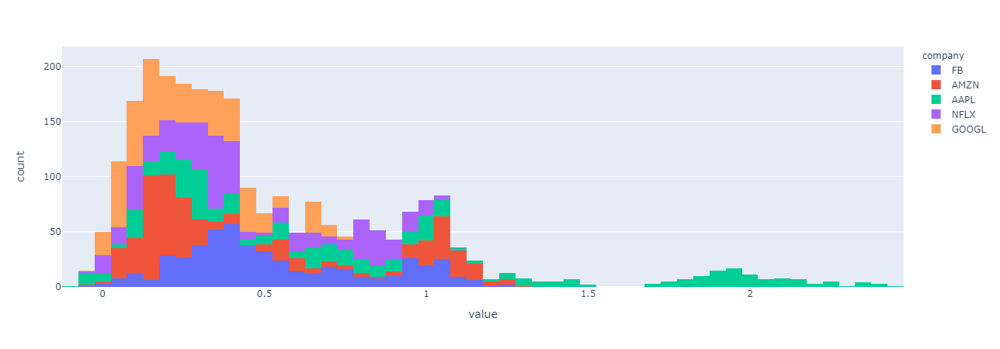

In [47]:
px.histogram(df_ratio)

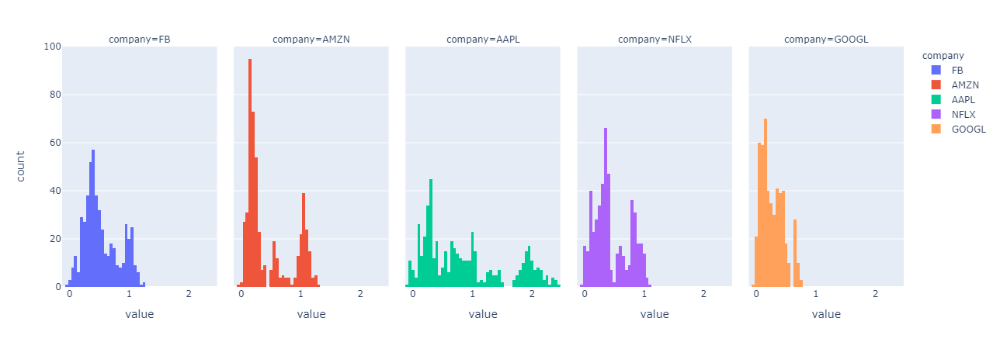

In [48]:
px.histogram(df_ratio, facet_col='company')

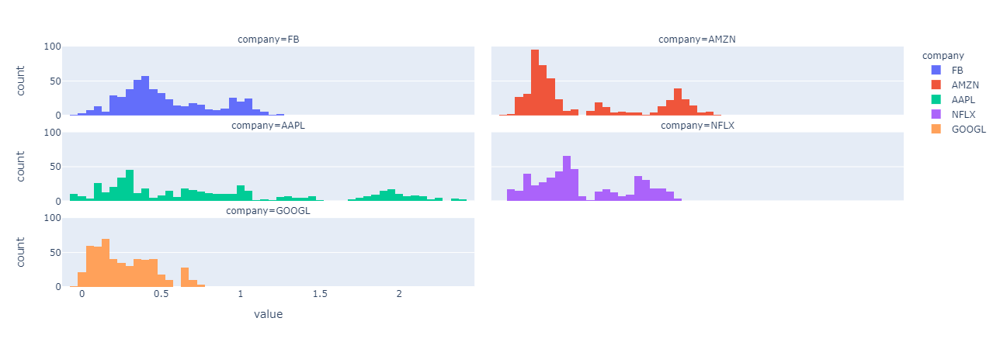

In [49]:
px.histogram(df_ratio, facet_col='company', facet_col_wrap=2)

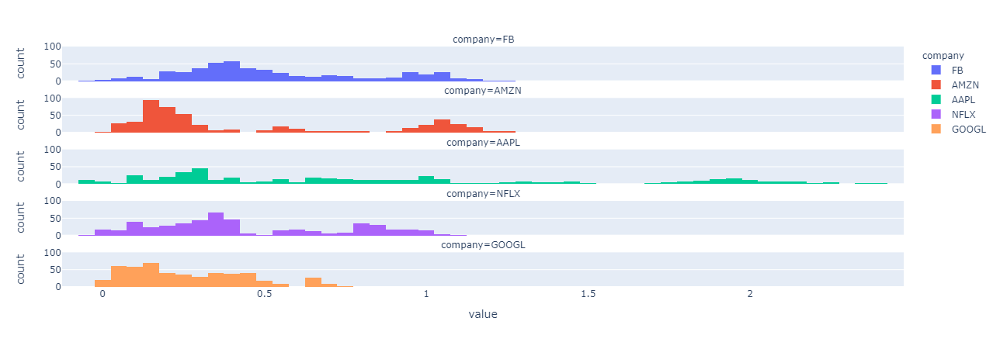

In [50]:
px.histogram(df_ratio, facet_col='company', facet_col_wrap=1)